In [1]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

In [2]:
with open('annotations.json', 'r') as f:
    data = json.load(f) #dictionary

# Verificar que se cargó bien
print(type(data))  # Debe ser <class 'dict'>
print(data.keys())  # Ver las claves principales ("tags", "images")
print(len(data["images"]))  # Número de imágenes en el dataset


<class 'dict'>
dict_keys(['tags', 'images'])
5


In [3]:
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches

def draw_original_bounding_boxes(annotation, image_path):
    """
    Dibuja los bounding boxes originales de single_axle, car y other sobre la imagen.

    :param annotation: JSON con anotaciones originales.
    :param image_path: Ruta de la imagen donde dibujar las cajas.
    """
    # Cargar la imagen
    img = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(img)

    # Buscar las anotaciones de la imagen correspondiente
    for img_data in annotation["images"]:
        if img_data["location"] == image_path:  # Si es la imagen que buscamos
            for region in img_data["annotated_regions"]:
                bbox = region["region"]

                # Definir color según la categoría
                if "single_axle" in region["tags"]:
                    color = "b"  # Azul para single_axle
                elif "car" in region["tags"]:
                    color = "g"  # Verde para car
                elif "other" in region["tags"]:
                    color = "y"  # Amarillo para other
                else:
                    color = "gray"  # Para cualquier otra clase

                # Crear el rectángulo del bounding box
                rect = patches.Rectangle(
                    (bbox["xmin"] * img.width, bbox["ymin"] * img.height),
                    (bbox["xmax"] - bbox["xmin"]) * img.width,
                    (bbox["ymax"] - bbox["ymin"]) * img.height,
                    linewidth=2, edgecolor=color, facecolor='none'
                )

                # Agregar etiqueta con la categoría
                ax.text(bbox["xmin"] * img.width, bbox["ymin"] * img.height,
                        region["tags"][0], color=color, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

                # Agregar el rectángulo a la imagen
                ax.add_patch(rect)

    plt.show()


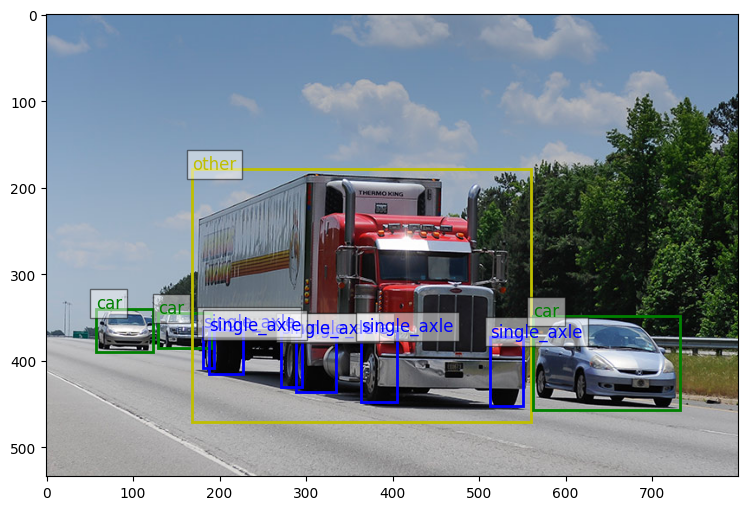

In [4]:
# Cargar el JSON original
with open("annotations.json", "r") as f:
    data = json.load(f)

# Dibujar los bounding boxes originales en una imagen
draw_original_bounding_boxes(data, "images/pic1.jpg")  # Cambia por la imagen que quieras probar


In [5]:
def extract_single_axle_boxes(annotation):
    """
    Extrae todas las cajas bounding boxes de single_axle del JSON.

    :param annotation: JSON con las anotaciones originales.
    :return: Lista de diccionarios con bounding boxes de single_axle.
    """
    single_axle_boxes = []  # Lista donde guardaremos las cajas single_axle

    for image in annotation["images"]:
        for region in image["annotated_regions"]:
            if "single_axle" in region["tags"]:
                bbox = region["region"]
                single_axle_boxes.append(bbox)

    print(f"Total de single_axle detectados: {len(single_axle_boxes)}")
    return single_axle_boxes


In [6]:
single_axle_boxes_by_image = {}
for image in data["images"]:
    image_id = image["location"]
    single_axle_boxes_by_image[image_id] = [
        region["region"] for region in image["annotated_regions"] if "single_axle" in region["tags"]
    ]

# 🔍 Verificar si hay cajas antes de la fusión
print("\n🔍 Diagnóstico antes de merge_boxes():")
for image_id, boxes in single_axle_boxes_by_image.items():
    print(f"📌 Imagen: {image_id}, Total single_axle: {len(boxes)}")
    if len(boxes) > 0:
        print("🔹 Ejemplo de caja single_axle:", boxes[0])
        break  # Solo imprimir la primera imagen con cajas para no saturar la salida



🔍 Diagnóstico antes de merge_boxes():
📌 Imagen: images/pic1.jpg, Total single_axle: 6
🔹 Ejemplo de caja single_axle: {'xmin': 0.6413427734375, 'ymin': 0.6965780079588015, 'xmax': 0.688720703125, 'ymax': 0.8477147705992509}


In [7]:
single_axle_boxes = extract_single_axle_boxes(data)
print(single_axle_boxes[:5])  # Ver las primeras 5 bounding boxes


Total de single_axle detectados: 29
[{'xmin': 0.6413427734375, 'ymin': 0.6965780079588015, 'xmax': 0.688720703125, 'ymax': 0.8477147705992509}, {'xmin': 0.3599468994140625, 'ymin': 0.6887298469686329, 'xmax': 0.4178986358642578, 'ymax': 0.815910196482912}, {'xmin': 0.3394189453125, 'ymin': 0.6878072331460674, 'xmax': 0.3684814453125, 'ymax': 0.8056384597378277}, {'xmin': 0.4545947265625, 'ymin': 0.6849762991573034, 'xmax': 0.5063427734375, 'ymax': 0.8378686797752809}, {'xmin': 0.2260498046875, 'ymin': 0.6758178253745318, 'xmax': 0.24232421875, 'ymax': 0.7654494382022472}]


In [8]:
def merge_boxes(single_axle_boxes_by_image, overlap_threshold=0.01):
    """
    Fusiona bounding boxes de single_axle que se superponen o están muy cerca en el eje X.
    Devuelve un diccionario con las bounding boxes fusionadas y también mantiene las individuales.

    :param single_axle_boxes_by_image: Diccionario {imagen_id: lista de bounding boxes}.
    :param overlap_threshold: Margen para fusionar cajas que estén cerca.
    :return: Diccionario {imagen_id: {'grouped_axles': [...], 'single_axle': [...]}}.
    """
    merged_boxes_by_image = {}

    for image_id, single_axle_boxes in single_axle_boxes_by_image.items():
        merged_boxes = []
        remaining_single_axle = set(range(len(single_axle_boxes)))  # Índices de cajas individuales

        # Ordenamos las cajas de izquierda a derecha
        single_axle_boxes = sorted(single_axle_boxes, key=lambda b: b["xmin"])

        for i, box1 in enumerate(single_axle_boxes):
            if i not in remaining_single_axle:
                continue  # Saltamos si ya fue fusionada

            group = [box1]
            current_xmax = box1["xmax"]

            for j in range(i + 1, len(single_axle_boxes)):
                box2 = single_axle_boxes[j]
                if j not in remaining_single_axle:
                    continue

                # Si box2 se solapa o está cerca de box1, se une al grupo
                if box2["xmin"] <= current_xmax + overlap_threshold:
                    group.append(box2)
                    remaining_single_axle.remove(j)  # Eliminamos box2 de la lista de single_axle
                    current_xmax = max(current_xmax, box2["xmax"])  # Actualizar el límite derecho

            # Si hay más de una caja en el grupo, creamos un grouped_axles
            if len(group) > 1:
                merged_xmin = min(b["xmin"] for b in group)
                merged_xmax = max(b["xmax"] for b in group)
                merged_ymin = min(b["ymin"] for b in group)
                merged_ymax = max(b["ymax"] for b in group)

                merged_boxes.append({
                    "xmin": merged_xmin,
                    "ymin": merged_ymin,
                    "xmax": merged_xmax,
                    "ymax": merged_ymax
                })

        # Guardamos en el diccionario la lista de grouped_axles y single_axle no fusionados
        merged_boxes_by_image[image_id] = {
            "grouped_axles": merged_boxes,
            "single_axle": [single_axle_boxes[i] for i in remaining_single_axle]
        }

    return merged_boxes_by_image


In [9]:
def update_annotations(annotation, merged_boxes_by_image):
    """
    Actualiza el JSON original con grouped_axles y mantiene los single_axle no fusionados.

    :param annotation: JSON original.
    :param merged_boxes_by_image: Diccionario {imagen_id: {'grouped_axles': [...], 'single_axle': [...]}}.
    :return: JSON actualizado con las anotaciones corregidas.
    """
    for image in annotation["images"]:
        image_id = image["location"]
        updated_regions = []

        # Mantener todas las anotaciones originales que NO son single_axle
        for region in image["annotated_regions"]:
            if "single_axle" not in region["tags"]:
                updated_regions.append(region)

        # 🔥 Agregar grouped_axles a la imagen correcta
        if image_id in merged_boxes_by_image:
            for merged_box in merged_boxes_by_image[image_id]["grouped_axles"]:
                updated_regions.append({
                    "tags": ["grouped_axles"],
                    "region_type": "Box",
                    "region": {
                        "xmin": float(merged_box["xmin"]),
                        "ymin": float(merged_box["ymin"]),
                        "xmax": float(merged_box["xmax"]),
                        "ymax": float(merged_box["ymax"]),
                    }
                })

            # 🔥 Agregar los single_axle que NO fueron fusionados
            for single_box in merged_boxes_by_image[image_id]["single_axle"]:
                updated_regions.append({
                    "tags": ["single_axle"],
                    "region_type": "Box",
                    "region": {
                        "xmin": float(single_box["xmin"]),
                        "ymin": float(single_box["ymin"]),
                        "xmax": float(single_box["xmax"]),
                        "ymax": float(single_box["ymax"]),
                    }
                })

        # Guardamos las anotaciones corregidas
        image["annotated_regions"] = updated_regions

    return annotation  # ✅ Devolver el JSON corregido


In [10]:
def draw_box(ax, bbox, color, label, img):
    """Dibuja una caja con su etiqueta."""
    rect = patches.Rectangle(
        (bbox["xmin"] * img.width, bbox["ymin"] * img.height),
        (bbox["xmax"] - bbox["xmin"]) * img.width,
        (bbox["ymax"] - bbox["ymin"]) * img.height,
        linewidth=2, edgecolor=color, facecolor='none'
    )
    ax.add_patch(rect)
    ax.text(bbox["xmin"] * img.width, bbox["ymin"] * img.height,
            label, color=color, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))


In [11]:
def draw_bounding_boxes(annotation, image_path, merged_boxes_by_image):
    """
    Dibuja los bounding boxes sobre una imagen, diferenciando entre single_axle y grouped_axles.

    :param annotation: JSON actualizado con anotaciones.
    :param image_path: Ruta de la imagen donde dibujar las cajas.
    :param merged_boxes_by_image: Diccionario con las cajas agrupadas y no agrupadas.
    """
    # Cargar la imagen
    img = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(img)

    grouped_axles = merged_boxes_by_image.get(image_path, {}).get("grouped_axles", [])
    single_axle_boxes = merged_boxes_by_image.get(image_path, {}).get("single_axle", [])

    # 🔥 Dibujar primero los grouped_axles en rojo
    for bbox in grouped_axles:
        draw_box(ax, bbox, "r", "grouped_axles", img)

    # 🔥 Dibujar los single_axle en azul SOLO si NO están dentro de un grouped_axles
    for bbox in single_axle_boxes:
        if not any(is_inside(bbox, g_bbox) for g_bbox in grouped_axles):  # ❌ Filtrar duplicados
            draw_box(ax, bbox, "b", "single_axle", img)

    # 🔥 Dibujar las otras etiquetas (car y other) en verde y amarillo
    for img_data in annotation["images"]:
        if img_data["location"] == image_path:
            for region in img_data["annotated_regions"]:
                bbox = region["region"]
                tag = region["tags"][0]

                if tag in ["car", "other"]:
                    color = "g" if tag == "car" else "y"
                    draw_box(ax, bbox, color, tag, img)

    plt.show()

def is_inside(box1, box2):
    """Devuelve True si box1 está completamente dentro de box2"""
    return (box1["xmin"] >= box2["xmin"] and
            box1["xmax"] <= box2["xmax"] and
            box1["ymin"] >= box2["ymin"] and
            box1["ymax"] <= box2["ymax"])



🔍 Diagnóstico después de merge_boxes():
📌 Imagen: images/pic1.jpg, Total grouped_axles: 2, Total single_axle restantes: 4
🔹 Ejemplo de caja grouped_axles: {'xmin': 0.2260498046875, 'ymin': 0.6758178253745318, 'xmax': 0.284169921875, 'ymax': 0.7772486540262172}
🔹 Ejemplo de caja single_axle restante: {'xmin': 0.2260498046875, 'ymin': 0.6758178253745318, 'xmax': 0.24232421875, 'ymax': 0.7654494382022472}


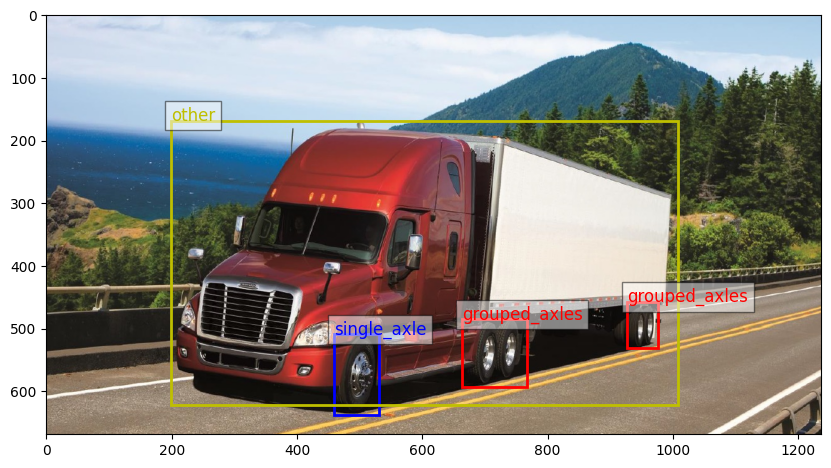

✅ JSON final guardado en new_annotations.json


In [12]:
# 1️⃣ Cargar el JSON original
with open("annotations.json", "r") as f:
    data = json.load(f)

# 2️⃣ Extraer bounding boxes de cada imagen
single_axle_boxes_by_image = {}
for image in data["images"]:
    image_id = image["location"]
    single_axle_boxes_by_image[image_id] = [
        region["region"] for region in image["annotated_regions"] if "single_axle" in region["tags"]
    ]

# 3️⃣ Aplicar la fusión dentro de cada imagen
merged_boxes_by_image = merge_boxes(single_axle_boxes_by_image)

print("\n🔍 Diagnóstico después de merge_boxes():")
for image_id, boxes in merged_boxes_by_image.items():
    print(f"📌 Imagen: {image_id}, Total grouped_axles: {len(boxes['grouped_axles'])}, Total single_axle restantes: {len(boxes['single_axle'])}")
    if len(boxes["grouped_axles"]) > 0:
        print("🔹 Ejemplo de caja grouped_axles:", boxes["grouped_axles"][0])
    if len(boxes["single_axle"]) > 0:
        print("🔹 Ejemplo de caja single_axle restante:", boxes["single_axle"][0])
    break  # Solo imprimir la primera imagen con cajas para no saturar la salida


# 4️⃣ Actualizar el JSON con las cajas fusionadas en su imagen correcta
updated_json = update_annotations(data, merged_boxes_by_image)

# 5️⃣ Dibujar bounding boxes fusionadas en una imagen de prueba
draw_bounding_boxes(updated_json, "images/pic2.jpg", merged_boxes_by_image)

# 6️⃣ Guardar el JSON corregido
with open("new_annotations.json", "w") as f:
    json.dump(updated_json, f, indent=4)

print("✅ JSON final guardado en new_annotations.json")


In [13]:
# Revisar etiquetas en el JSON final
all_tags = set()

for image in data["images"]:
    for region in image["annotated_regions"]:
        all_tags.update(region["tags"])  # Agregar todas las etiquetas únicas

print("Etiquetas en el JSON de salida:", all_tags)


Etiquetas en el JSON de salida: {'other', 'grouped_axles', 'car', 'single_axle'}


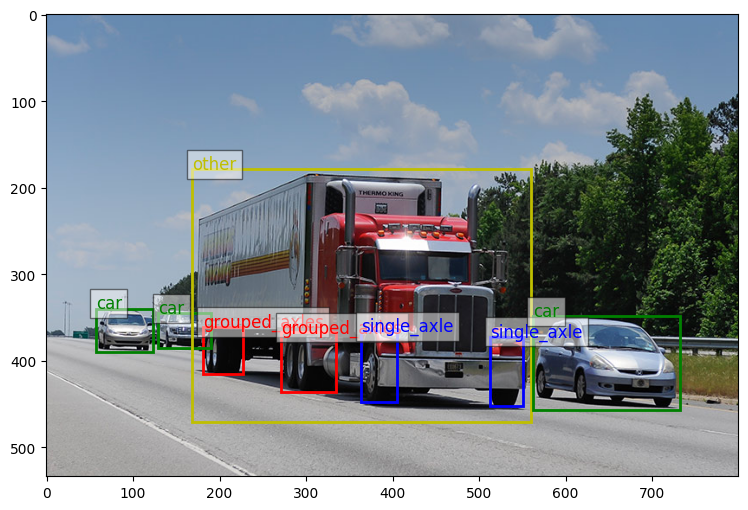

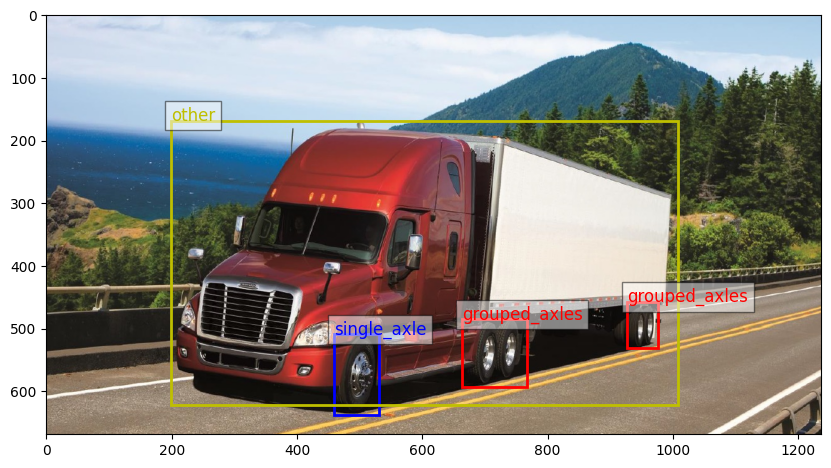

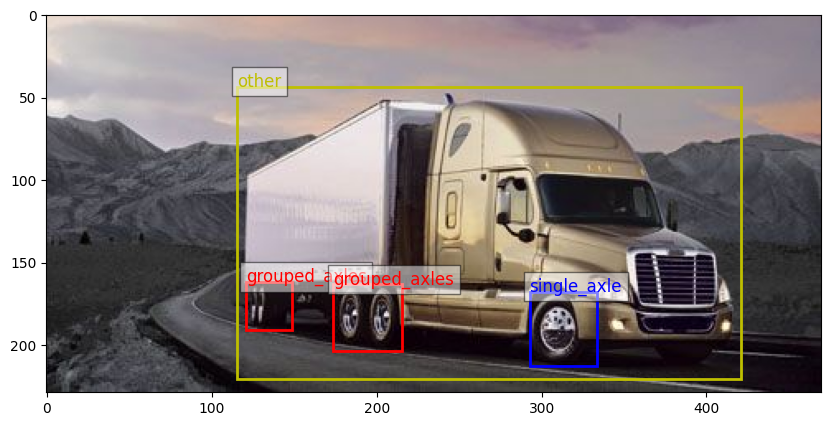

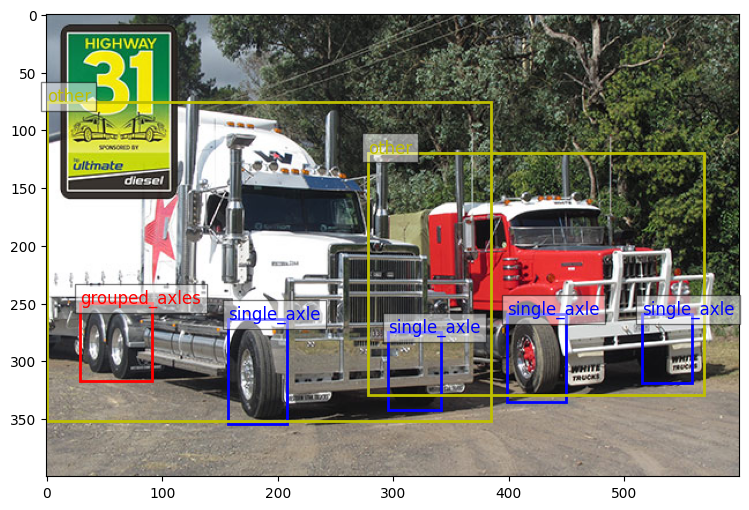

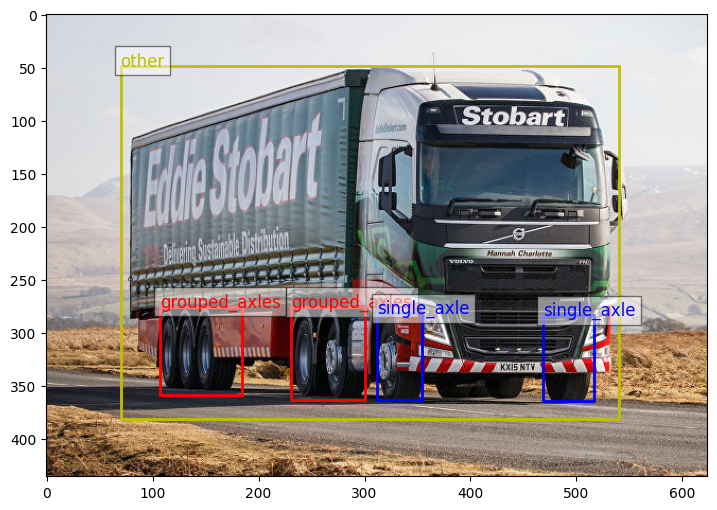

In [14]:
draw_bounding_boxes(updated_json, "images/pic1.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic2.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic3.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic4.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic5.jpg", merged_boxes_by_image)


In [15]:
# 6️⃣ Guardar el JSON corregido
with open("final_annotations.json", "w") as f:
    json.dump(updated_json, f, indent=4)

print("✅ JSON final guardado en final_annotations.json")


✅ JSON final guardado en final_annotations.json


In [16]:
tag_counts = {"car": 0, "other": 0, "single_axle": 0, "grouped_axles": 0}

for image in updated_json["images"]:
    for region in image["annotated_regions"]:
        for tag in region["tags"]:
            if tag in tag_counts:
                tag_counts[tag] += 1

print("\n🔍 Diagnóstico final del JSON:")
for tag, count in tag_counts.items():
    print(f"📌 {tag}: {count}")



🔍 Diagnóstico final del JSON:
📌 car: 3
📌 other: 6
📌 single_axle: 19
📌 grouped_axles: 9


In [17]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

In [18]:
with open('annotations.json', 'r') as f:
    data = json.load(f) #dictionary

# Verificar que se cargó bien
print(type(data))  # Debe ser <class 'dict'>
print(data.keys())  # Ver las claves principales ("tags", "images")
print(len(data["images"]))  # Número de imágenes en el dataset


<class 'dict'>
dict_keys(['tags', 'images'])
5


In [19]:
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches

def draw_original_bounding_boxes(annotation, image_path):
    """
    Dibuja los bounding boxes originales de single_axle, car y other sobre la imagen.

    :param annotation: JSON con anotaciones originales.
    :param image_path: Ruta de la imagen donde dibujar las cajas.
    """
    # Cargar la imagen
    img = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(img)

    # Buscar las anotaciones de la imagen correspondiente
    for img_data in annotation["images"]:
        if img_data["location"] == image_path:  # Si es la imagen que buscamos
            for region in img_data["annotated_regions"]:
                bbox = region["region"]

                # Definir color según la categoría
                if "single_axle" in region["tags"]:
                    color = "b"  # Azul para single_axle
                elif "car" in region["tags"]:
                    color = "g"  # Verde para car
                elif "other" in region["tags"]:
                    color = "y"  # Amarillo para other
                else:
                    color = "gray"  # Para cualquier otra clase

                # Crear el rectángulo del bounding box
                rect = patches.Rectangle(
                    (bbox["xmin"] * img.width, bbox["ymin"] * img.height),
                    (bbox["xmax"] - bbox["xmin"]) * img.width,
                    (bbox["ymax"] - bbox["ymin"]) * img.height,
                    linewidth=2, edgecolor=color, facecolor='none'
                )

                # Agregar etiqueta con la categoría
                ax.text(bbox["xmin"] * img.width, bbox["ymin"] * img.height,
                        region["tags"][0], color=color, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

                # Agregar el rectángulo a la imagen
                ax.add_patch(rect)

    plt.show()


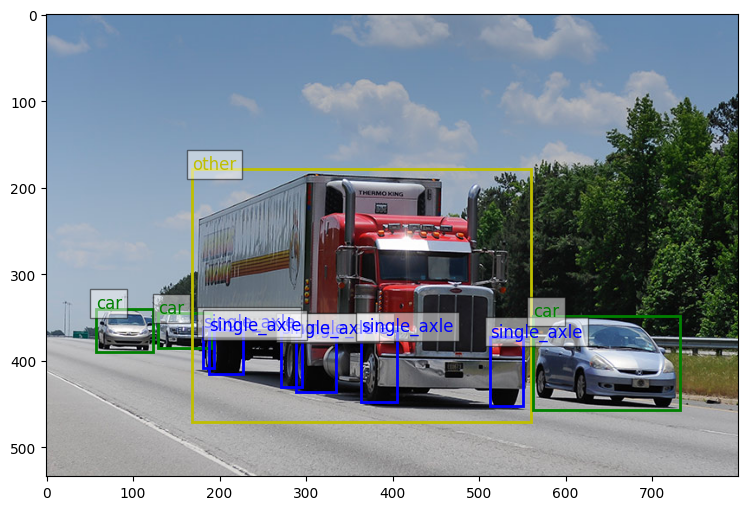

In [20]:
# Cargar el JSON original
with open("annotations.json", "r") as f:
    data = json.load(f)

# Dibujar los bounding boxes originales en una imagen
draw_original_bounding_boxes(data, "images/pic1.jpg")  # Cambia por la imagen que quieras probar


In [21]:
def extract_single_axle_boxes(annotation):
    """
    Extrae todas las cajas bounding boxes de single_axle del JSON.

    :param annotation: JSON con las anotaciones originales.
    :return: Lista de diccionarios con bounding boxes de single_axle.
    """
    single_axle_boxes = []  # Lista donde guardaremos las cajas single_axle

    for image in annotation["images"]:
        for region in image["annotated_regions"]:
            if "single_axle" in region["tags"]:
                bbox = region["region"]
                single_axle_boxes.append(bbox)

    print(f"Total de single_axle detectados: {len(single_axle_boxes)}")
    return single_axle_boxes


In [22]:
single_axle_boxes_by_image = {}
for image in data["images"]:
    image_id = image["location"]
    single_axle_boxes_by_image[image_id] = [
        region["region"] for region in image["annotated_regions"] if "single_axle" in region["tags"]
    ]

# 🔍 Verificar si hay cajas antes de la fusión
print("\n🔍 Diagnóstico antes de merge_boxes():")
for image_id, boxes in single_axle_boxes_by_image.items():
    print(f"📌 Imagen: {image_id}, Total single_axle: {len(boxes)}")
    if len(boxes) > 0:
        print("🔹 Ejemplo de caja single_axle:", boxes[0])
        break  # Solo imprimir la primera imagen con cajas para no saturar la salida



🔍 Diagnóstico antes de merge_boxes():
📌 Imagen: images/pic1.jpg, Total single_axle: 6
🔹 Ejemplo de caja single_axle: {'xmin': 0.6413427734375, 'ymin': 0.6965780079588015, 'xmax': 0.688720703125, 'ymax': 0.8477147705992509}


In [23]:
single_axle_boxes = extract_single_axle_boxes(data)
print(single_axle_boxes[:5])  # Ver las primeras 5 bounding boxes


Total de single_axle detectados: 29
[{'xmin': 0.6413427734375, 'ymin': 0.6965780079588015, 'xmax': 0.688720703125, 'ymax': 0.8477147705992509}, {'xmin': 0.3599468994140625, 'ymin': 0.6887298469686329, 'xmax': 0.4178986358642578, 'ymax': 0.815910196482912}, {'xmin': 0.3394189453125, 'ymin': 0.6878072331460674, 'xmax': 0.3684814453125, 'ymax': 0.8056384597378277}, {'xmin': 0.4545947265625, 'ymin': 0.6849762991573034, 'xmax': 0.5063427734375, 'ymax': 0.8378686797752809}, {'xmin': 0.2260498046875, 'ymin': 0.6758178253745318, 'xmax': 0.24232421875, 'ymax': 0.7654494382022472}]


In [24]:
def merge_boxes(single_axle_boxes_by_image, overlap_threshold=0.01):
    """
    Fusiona bounding boxes de single_axle que se superponen o están muy cerca en el eje X.
    Devuelve un diccionario con las bounding boxes fusionadas y también mantiene las individuales.

    :param single_axle_boxes_by_image: Diccionario {imagen_id: lista de bounding boxes}.
    :param overlap_threshold: Margen para fusionar cajas que estén cerca.
    :return: Diccionario {imagen_id: {'grouped_axles': [...], 'single_axle': [...]}}.
    """
    merged_boxes_by_image = {}

    for image_id, single_axle_boxes in single_axle_boxes_by_image.items():
        merged_boxes = []
        remaining_single_axle = set(range(len(single_axle_boxes)))  # Índices de cajas individuales

        # Ordenamos las cajas de izquierda a derecha
        single_axle_boxes = sorted(single_axle_boxes, key=lambda b: b["xmin"])

        for i, box1 in enumerate(single_axle_boxes):
            if i not in remaining_single_axle:
                continue  # Saltamos si ya fue fusionada

            group = [box1]
            current_xmax = box1["xmax"]

            for j in range(i + 1, len(single_axle_boxes)):
                box2 = single_axle_boxes[j]
                if j not in remaining_single_axle:
                    continue

                # Si box2 se solapa o está cerca de box1, se une al grupo
                if box2["xmin"] <= current_xmax + overlap_threshold:
                    group.append(box2)
                    remaining_single_axle.remove(j)  # Eliminamos box2 de la lista de single_axle
                    current_xmax = max(current_xmax, box2["xmax"])  # Actualizar el límite derecho

            # Si hay más de una caja en el grupo, creamos un grouped_axles
            if len(group) > 1:
                merged_xmin = min(b["xmin"] for b in group)
                merged_xmax = max(b["xmax"] for b in group)
                merged_ymin = min(b["ymin"] for b in group)
                merged_ymax = max(b["ymax"] for b in group)

                merged_boxes.append({
                    "xmin": merged_xmin,
                    "ymin": merged_ymin,
                    "xmax": merged_xmax,
                    "ymax": merged_ymax
                })

        # Guardamos en el diccionario la lista de grouped_axles y single_axle no fusionados
        merged_boxes_by_image[image_id] = {
            "grouped_axles": merged_boxes,
            "single_axle": [single_axle_boxes[i] for i in remaining_single_axle]
        }

    return merged_boxes_by_image


In [25]:
def update_annotations(annotation, merged_boxes_by_image):
    """
    Actualiza el JSON original con grouped_axles y mantiene los single_axle no fusionados.

    :param annotation: JSON original.
    :param merged_boxes_by_image: Diccionario {imagen_id: {'grouped_axles': [...], 'single_axle': [...]}}.
    :return: JSON actualizado con las anotaciones corregidas.
    """
    for image in annotation["images"]:
        image_id = image["location"]
        updated_regions = []

        # Mantener todas las anotaciones originales que NO son single_axle
        for region in image["annotated_regions"]:
            if "single_axle" not in region["tags"]:
                updated_regions.append(region)

        # 🔥 Agregar grouped_axles a la imagen correcta
        if image_id in merged_boxes_by_image:
            for merged_box in merged_boxes_by_image[image_id]["grouped_axles"]:
                updated_regions.append({
                    "tags": ["grouped_axles"],
                    "region_type": "Box",
                    "region": {
                        "xmin": float(merged_box["xmin"]),
                        "ymin": float(merged_box["ymin"]),
                        "xmax": float(merged_box["xmax"]),
                        "ymax": float(merged_box["ymax"]),
                    }
                })

            # 🔥 Agregar los single_axle que NO fueron fusionados
            for single_box in merged_boxes_by_image[image_id]["single_axle"]:
                updated_regions.append({
                    "tags": ["single_axle"],
                    "region_type": "Box",
                    "region": {
                        "xmin": float(single_box["xmin"]),
                        "ymin": float(single_box["ymin"]),
                        "xmax": float(single_box["xmax"]),
                        "ymax": float(single_box["ymax"]),
                    }
                })

        # Guardamos las anotaciones corregidas
        image["annotated_regions"] = updated_regions

    return annotation  # ✅ Devolver el JSON corregido


In [26]:
def draw_box(ax, bbox, color, label, img):
    """Dibuja una caja con su etiqueta."""
    rect = patches.Rectangle(
        (bbox["xmin"] * img.width, bbox["ymin"] * img.height),
        (bbox["xmax"] - bbox["xmin"]) * img.width,
        (bbox["ymax"] - bbox["ymin"]) * img.height,
        linewidth=2, edgecolor=color, facecolor='none'
    )
    ax.add_patch(rect)
    ax.text(bbox["xmin"] * img.width, bbox["ymin"] * img.height,
            label, color=color, fontsize=12, bbox=dict(facecolor='white', alpha=0.5))


In [27]:
def draw_bounding_boxes(annotation, image_path, merged_boxes_by_image):
    """
    Dibuja los bounding boxes sobre una imagen, diferenciando entre single_axle y grouped_axles.

    :param annotation: JSON actualizado con anotaciones.
    :param image_path: Ruta de la imagen donde dibujar las cajas.
    :param merged_boxes_by_image: Diccionario con las cajas agrupadas y no agrupadas.
    """
    # Cargar la imagen
    img = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(img)

    grouped_axles = merged_boxes_by_image.get(image_path, {}).get("grouped_axles", [])
    single_axle_boxes = merged_boxes_by_image.get(image_path, {}).get("single_axle", [])

    # 🔥 Dibujar primero los grouped_axles en rojo
    for bbox in grouped_axles:
        draw_box(ax, bbox, "r", "grouped_axles", img)

    # 🔥 Dibujar los single_axle en azul SOLO si NO están dentro de un grouped_axles
    for bbox in single_axle_boxes:
        if not any(is_inside(bbox, g_bbox) for g_bbox in grouped_axles):  # ❌ Filtrar duplicados
            draw_box(ax, bbox, "b", "single_axle", img)

    # 🔥 Dibujar las otras etiquetas (car y other) en verde y amarillo
    for img_data in annotation["images"]:
        if img_data["location"] == image_path:
            for region in img_data["annotated_regions"]:
                bbox = region["region"]
                tag = region["tags"][0]

                if tag in ["car", "other"]:
                    color = "g" if tag == "car" else "y"
                    draw_box(ax, bbox, color, tag, img)

    plt.show()

def is_inside(box1, box2):
    """Devuelve True si box1 está completamente dentro de box2"""
    return (box1["xmin"] >= box2["xmin"] and
            box1["xmax"] <= box2["xmax"] and
            box1["ymin"] >= box2["ymin"] and
            box1["ymax"] <= box2["ymax"])



🔍 Diagnóstico después de merge_boxes():
📌 Imagen: images/pic1.jpg, Total grouped_axles: 2, Total single_axle restantes: 4
🔹 Ejemplo de caja grouped_axles: {'xmin': 0.2260498046875, 'ymin': 0.6758178253745318, 'xmax': 0.284169921875, 'ymax': 0.7772486540262172}
🔹 Ejemplo de caja single_axle restante: {'xmin': 0.2260498046875, 'ymin': 0.6758178253745318, 'xmax': 0.24232421875, 'ymax': 0.7654494382022472}


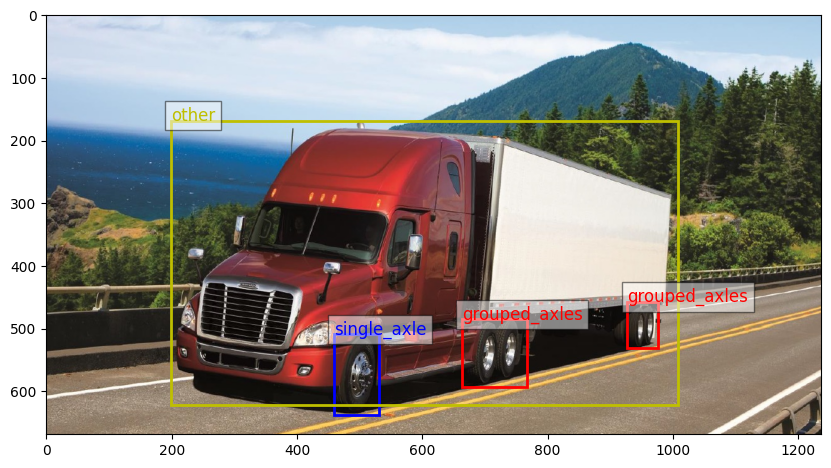

✅ JSON final guardado en merged_annotation.json


In [28]:
# 1️⃣ Cargar el JSON original
with open("annotations.json", "r") as f:
    data = json.load(f)

# 2️⃣ Extraer bounding boxes de cada imagen
single_axle_boxes_by_image = {}
for image in data["images"]:
    image_id = image["location"]
    single_axle_boxes_by_image[image_id] = [
        region["region"] for region in image["annotated_regions"] if "single_axle" in region["tags"]
    ]

# 3️⃣ Aplicar la fusión dentro de cada imagen
merged_boxes_by_image = merge_boxes(single_axle_boxes_by_image)

print("\n🔍 Diagnóstico después de merge_boxes():")
for image_id, boxes in merged_boxes_by_image.items():
    print(f"📌 Imagen: {image_id}, Total grouped_axles: {len(boxes['grouped_axles'])}, Total single_axle restantes: {len(boxes['single_axle'])}")
    if len(boxes["grouped_axles"]) > 0:
        print("🔹 Ejemplo de caja grouped_axles:", boxes["grouped_axles"][0])
    if len(boxes["single_axle"]) > 0:
        print("🔹 Ejemplo de caja single_axle restante:", boxes["single_axle"][0])
    break  # Solo imprimir la primera imagen con cajas para no saturar la salida


# 4️⃣ Actualizar el JSON con las cajas fusionadas en su imagen correcta
updated_json = update_annotations(data, merged_boxes_by_image)

# 5️⃣ Dibujar bounding boxes fusionadas en una imagen de prueba
draw_bounding_boxes(updated_json, "images/pic2.jpg", merged_boxes_by_image)

# 6️⃣ Guardar el JSON corregido
with open("merged_annotation.json", "w") as f:
    json.dump(updated_json, f, indent=4)

print("✅ JSON final guardado en merged_annotation.json")


In [29]:
# Revisar etiquetas en el JSON final
all_tags = set()

for image in data["images"]:
    for region in image["annotated_regions"]:
        all_tags.update(region["tags"])  # Agregar todas las etiquetas únicas

print("Etiquetas en el JSON de salida:", all_tags)


Etiquetas en el JSON de salida: {'other', 'grouped_axles', 'car', 'single_axle'}


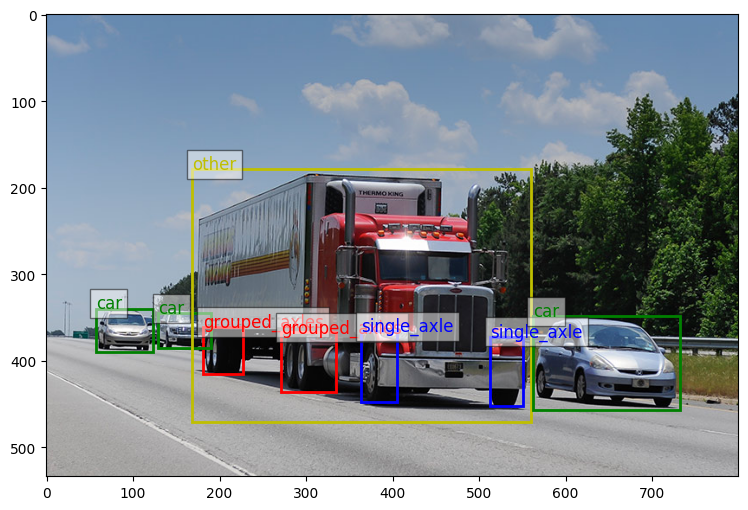

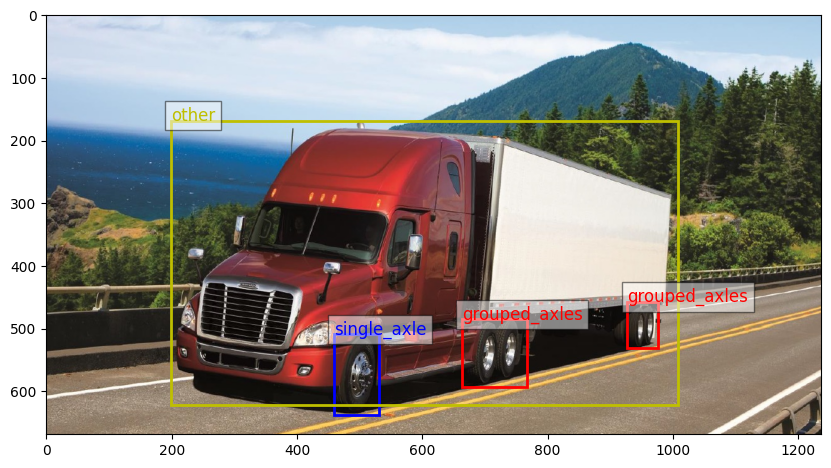

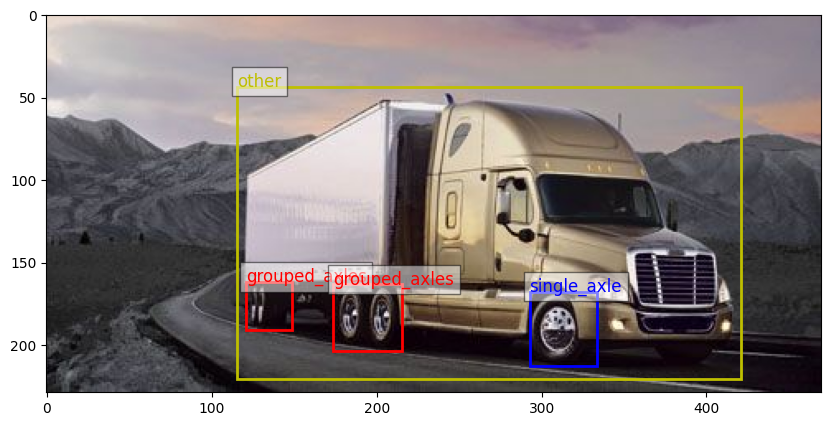

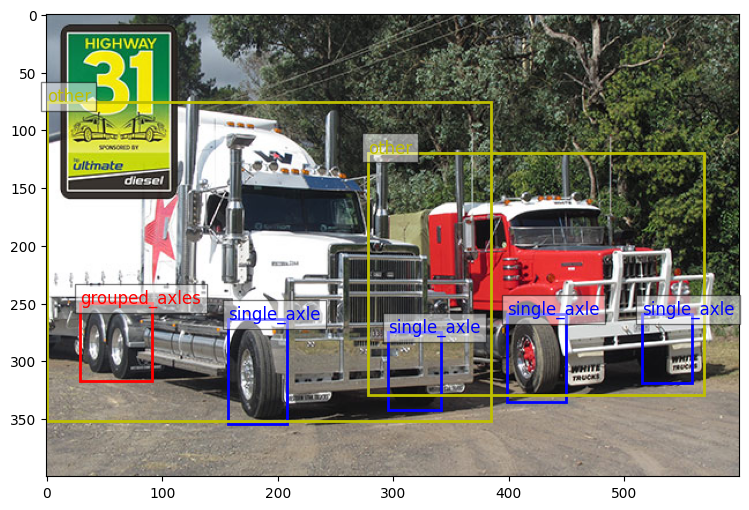

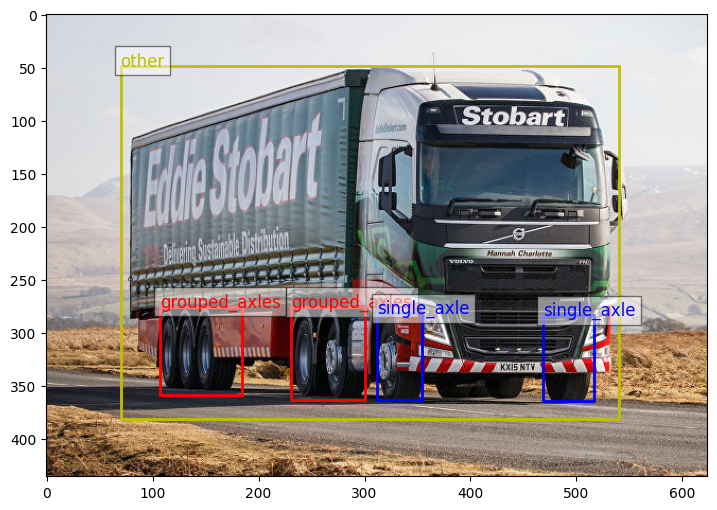

In [30]:
draw_bounding_boxes(updated_json, "images/pic1.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic2.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic3.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic4.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic5.jpg", merged_boxes_by_image)


In [31]:
# 6️⃣ Guardar el JSON corregido
with open("final_annotations.json", "w") as f:
    json.dump(updated_json, f, indent=4)

print("✅ JSON final guardado en final_annotations.json")


✅ JSON final guardado en final_annotations.json


In [32]:
tag_counts = {"car": 0, "other": 0, "single_axle": 0, "grouped_axles": 0}

for image in updated_json["images"]:
    for region in image["annotated_regions"]:
        for tag in region["tags"]:
            if tag in tag_counts:
                tag_counts[tag] += 1

print("\n🔍 Diagnóstico final del JSON:")
for tag, count in tag_counts.items():
    print(f"📌 {tag}: {count}")



🔍 Diagnóstico final del JSON:
📌 car: 3
📌 other: 6
📌 single_axle: 19
📌 grouped_axles: 9


In [33]:
"""🔄 Plan de acción

1️⃣ Incorporar las funciones existentes en merge_axle_trees.py, asegurando modularidad:

merge_boxes(): para fusionar los single_axle en grouped_axles.
update_annotations(): para actualizar el JSON con los cambios.
open_json_from_file() y save_json_to_file(): ya están en el template, los reutilizamos.

2️⃣ Modificar merge_axle_trees() para que actúe como orquestador de la pipeline:

Leer el JSON original.
Extraer single_axle por imagen.
Aplicar merge_boxes().
Actualizar el JSON con update_annotations().
Devolver el JSON transformado.

3️⃣ Eliminar cualquier visualización (ej. draw_bounding_boxes()) porque no es parte del requerimiento.

4️⃣ Mantener la estructura del template, asegurándonos de que el script se pueda ejecutar con:

bash
Copiar
Editar
python3 merge_axle_trees.py
y genere new_annotations.json.

5️⃣ Verificar que test.py valide correctamente la salida, asegurándonos de que no haya single_axle dentro de grouped_axles.

"""


'🔄 Plan de acción\n\n1️⃣ Incorporar las funciones existentes en merge_axle_trees.py, asegurando modularidad:\n\nmerge_boxes(): para fusionar los single_axle en grouped_axles.\nupdate_annotations(): para actualizar el JSON con los cambios.\nopen_json_from_file() y save_json_to_file(): ya están en el template, los reutilizamos.\n\n2️⃣ Modificar merge_axle_trees() para que actúe como orquestador de la pipeline:\n\nLeer el JSON original.\nExtraer single_axle por imagen.\nAplicar merge_boxes().\nActualizar el JSON con update_annotations().\nDevolver el JSON transformado.\n\n3️⃣ Eliminar cualquier visualización (ej. draw_bounding_boxes()) porque no es parte del requerimiento.\n\n4️⃣ Mantener la estructura del template, asegurándonos de que el script se pueda ejecutar con:\n\nbash\nCopiar\nEditar\npython3 merge_axle_trees.py\ny genere new_annotations.json.\n\n5️⃣ Verificar que test.py valide correctamente la salida, asegurándonos de que no haya single_axle dentro de grouped_axles.\n\n'

In [34]:
"""Plan de acción
1️⃣ Reestructurar el código para que merge_axle_trees() haga el trabajo de:

Extraer single_axle.
Fusionar con merge_boxes().
Actualizar el JSON con update_annotations().
Retornar el JSON corregido.
2️⃣ Eliminar la variable single_axle_boxes_by_image del código global y hacer que todo esté dentro de merge_axle_trees() para que siga el formato del template.

3️⃣ Mantener open_json_from_file() y save_json_to_file() del template para leer y guardar el JSON.

4️⃣ Añadir merge_axle_trees() en el if __name__ == '__main__' para que el script se ejecute correctamente.

"""

"Plan de acción\n1️⃣ Reestructurar el código para que merge_axle_trees() haga el trabajo de:\n\nExtraer single_axle.\nFusionar con merge_boxes().\nActualizar el JSON con update_annotations().\nRetornar el JSON corregido.\n2️⃣ Eliminar la variable single_axle_boxes_by_image del código global y hacer que todo esté dentro de merge_axle_trees() para que siga el formato del template.\n\n3️⃣ Mantener open_json_from_file() y save_json_to_file() del template para leer y guardar el JSON.\n\n4️⃣ Añadir merge_axle_trees() en el if __name__ == '__main__' para que el script se ejecute correctamente.\n\n"

** TEST **** TEST **** TEST **** TEST **** TEST **

In [35]:
def merge_boxes(single_axle_boxes_by_image, overlap_threshold=0.01):
    """
    Merges bounding boxes of single_axle that are overlapping or very close in the X-axis.
    Returns a dictionary with merged grouped_axles and remaining single_axle boxes.

    :param single_axle_boxes_by_image: Dictionary {image_id: list of bounding boxes}.
    :param overlap_threshold: Margin to merge nearby boxes.
    :return: Dictionary {image_id: {'grouped_axles': [...], 'single_axle': [...]}}.
    """
    merged_boxes_by_image = {}

    for image_id, single_axle_boxes in single_axle_boxes_by_image.items():
        merged_boxes = []
        remaining_single_axle = set(range(len(single_axle_boxes)))  # Indices of individual boxes

        # Sort boxes from left to right
        single_axle_boxes = sorted(single_axle_boxes, key=lambda b: b["xmin"])

        for i, box1 in enumerate(single_axle_boxes):
            if i not in remaining_single_axle:
                continue  # Skip if already merged

            group = [box1]
            current_xmax = box1["xmax"]

            for j in range(i + 1, len(single_axle_boxes)):
                box2 = single_axle_boxes[j]
                if j not in remaining_single_axle:
                    continue

                # Merge if box2 overlaps or is close to box1
                if box2["xmin"] <= current_xmax + overlap_threshold:
                    group.append(box2)
                    remaining_single_axle.remove(j)  # Remove box2 from single_axle list
                    current_xmax = max(current_xmax, box2["xmax"])  # Update right boundary

            # Create a grouped_axles box if multiple boxes are merged
            if len(group) > 1:
                merged_xmin = min(b["xmin"] for b in group)
                merged_xmax = max(b["xmax"] for b in group)
                merged_ymin = min(b["ymin"] for b in group)
                merged_ymax = max(b["ymax"] for b in group)

                merged_boxes.append({
                    "xmin": merged_xmin,
                    "ymin": merged_ymin,
                    "xmax": merged_xmax,
                    "ymax": merged_ymax
                })

        # Store grouped_axles and remaining single_axle boxes
        merged_boxes_by_image[image_id] = {
            "grouped_axles": merged_boxes,
            "single_axle": [single_axle_boxes[i] for i in remaining_single_axle]
        }

    return merged_boxes_by_image

In [36]:

def update_annotations(annotation, merged_boxes_by_image):
    """
    Updates the original JSON with grouped_axles while keeping single_axle boxes that were not merged.

    :param annotation: Original JSON data.
    :param merged_boxes_by_image: Dictionary {image_id: {'grouped_axles': [...], 'single_axle': [...]}}.
    :return: Updated JSON with merged annotations.
    """
    for image in annotation["images"]:
        image_id = image["location"]
        updated_regions = []

        # Keep original annotations that are NOT single_axle
        for region in image["annotated_regions"]:
            if "single_axle" not in region["tags"]:
                updated_regions.append(region)

        # Add grouped_axles to the correct image
        if image_id in merged_boxes_by_image:
            for merged_box in merged_boxes_by_image[image_id]["grouped_axles"]:
                updated_regions.append({
                    "tags": ["grouped_axles"],
                    "region_type": "Box",
                    "region": {
                        "xmin": float(merged_box["xmin"]),
                        "ymin": float(merged_box["ymin"]),
                        "xmax": float(merged_box["xmax"]),
                        "ymax": float(merged_box["ymax"]),
                    }
                })

            # Add remaining single_axle boxes that were not merged
            for single_box in merged_boxes_by_image[image_id]["single_axle"]:
                updated_regions.append({
                    "tags": ["single_axle"],
                    "region_type": "Box",
                    "region": {
                        "xmin": float(single_box["xmin"]),
                        "ymin": float(single_box["ymin"]),
                        "xmax": float(single_box["xmax"]),
                        "ymax": float(single_box["ymax"]),
                    }
                })

        # Update annotations
        image["annotated_regions"] = updated_regions

    return annotation  # ✅ Return the corrected JSON


In [37]:

def merge_axle_trees(annotation):
    """
    Main function to process and merge axle trees.

    :param annotation: JSON with original annotations.
    :return: JSON with updated annotations where grouped_axles are merged.
    """
    # Extract single_axle bounding boxes per image
    single_axle_boxes_by_image = {}
    for image in annotation["images"]:
        image_id = image["location"]
        single_axle_boxes_by_image[image_id] = [
            region["region"] for region in image["annotated_regions"] if "single_axle" in region["tags"]
        ]

    # Merge close single_axle boxes
    merged_boxes_by_image = merge_boxes(single_axle_boxes_by_image)

    # Update JSON with merged annotations
    updated_annotation = update_annotations(annotation, merged_boxes_by_image)

    return updated_annotation

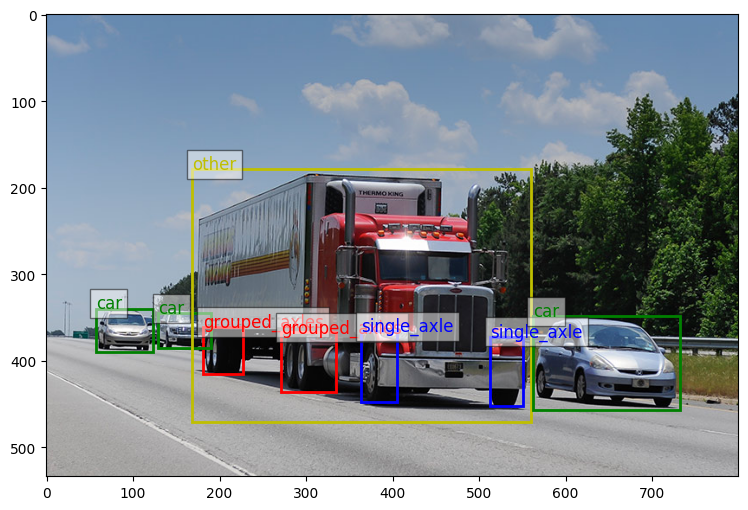

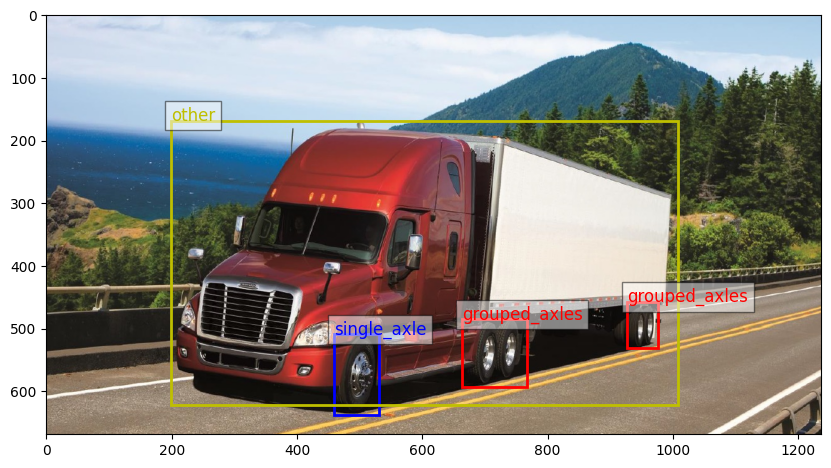

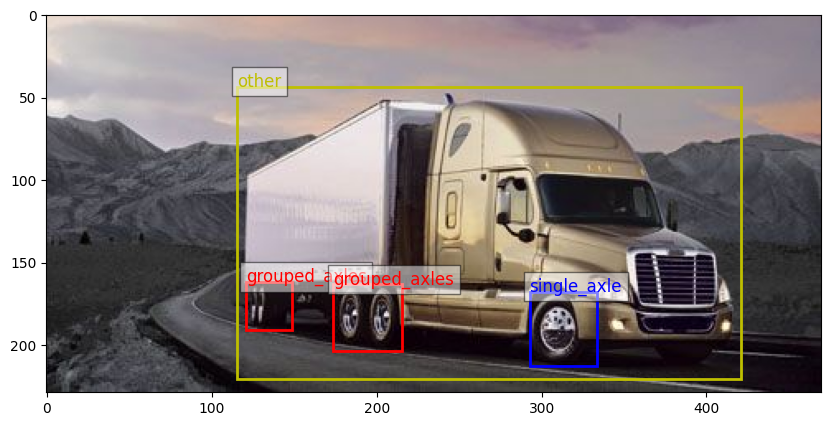

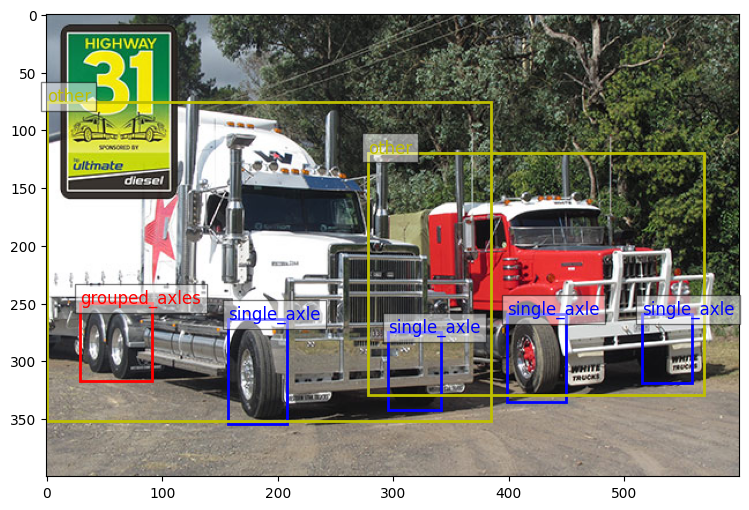

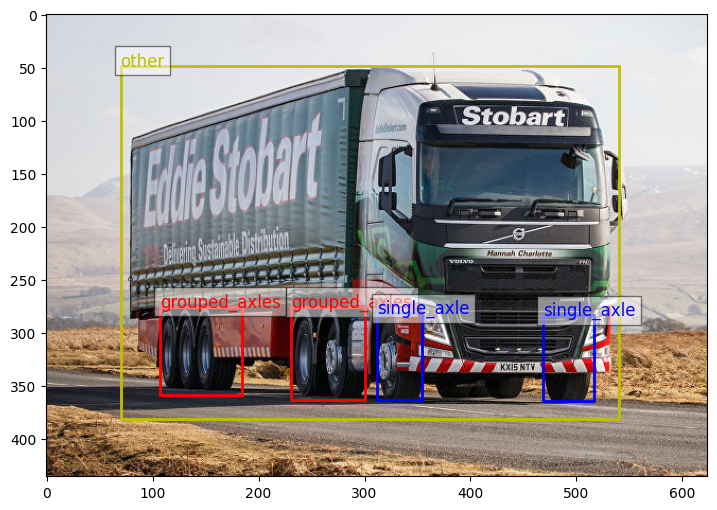

In [38]:
import json

# Cargar el JSON generado
with open("new_annotations.json", "r") as f:
    updated_json = json.load(f)

# Llamar a la función de visualización
draw_bounding_boxes(updated_json, "images/pic1.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic2.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic3.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic4.jpg", merged_boxes_by_image)
draw_bounding_boxes(updated_json, "images/pic5.jpg", merged_boxes_by_image)
